In [1]:
import tensorflow as tf
from libs import utils
from libs import vgg16

In [14]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [2]:
net = vgg16.get_vgg_model()

In [4]:
# place in cpu instead of gpu memory as it is a large graph

g = tf.Graph()
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    tf.import_graph_def(net['graph_def'], name='vgg')
    names = [op.name for op in g.get_operations()]

In [5]:
print(names)

['vgg/images', 'vgg/mul/y', 'vgg/mul', 'vgg/split/split_dim', 'vgg/split', 'vgg/sub/y', 'vgg/sub', 'vgg/sub_1/y', 'vgg/sub_1', 'vgg/sub_2/y', 'vgg/sub_2', 'vgg/concat/concat_dim', 'vgg/concat', 'vgg/conv1_1/filter', 'vgg/conv1_1/Conv2D', 'vgg/conv1_1/biases', 'vgg/conv1_1/BiasAdd', 'vgg/conv1_1/conv1_1', 'vgg/conv1_2/filter', 'vgg/conv1_2/Conv2D', 'vgg/conv1_2/biases', 'vgg/conv1_2/BiasAdd', 'vgg/conv1_2/conv1_2', 'vgg/pool1', 'vgg/conv2_1/filter', 'vgg/conv2_1/Conv2D', 'vgg/conv2_1/biases', 'vgg/conv2_1/BiasAdd', 'vgg/conv2_1/conv2_1', 'vgg/conv2_2/filter', 'vgg/conv2_2/Conv2D', 'vgg/conv2_2/biases', 'vgg/conv2_2/BiasAdd', 'vgg/conv2_2/conv2_2', 'vgg/pool2', 'vgg/conv3_1/filter', 'vgg/conv3_1/Conv2D', 'vgg/conv3_1/biases', 'vgg/conv3_1/BiasAdd', 'vgg/conv3_1/conv3_1', 'vgg/conv3_2/filter', 'vgg/conv3_2/Conv2D', 'vgg/conv3_2/biases', 'vgg/conv3_2/BiasAdd', 'vgg/conv3_2/conv3_2', 'vgg/conv3_3/filter', 'vgg/conv3_3/Conv2D', 'vgg/conv3_3/biases', 'vgg/conv3_3/BiasAdd', 'vgg/conv3_3/conv3_

In [6]:
# grab input and output operations of the network

x = g.get_tensor_by_name(names[0] + ':0')
softmax = g.get_tensor_by_name(names[-2] + ':0')

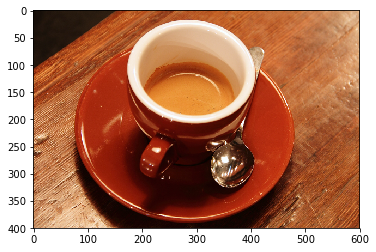

In [9]:
from skimage.data import coffee

og = coffee()
plt.imshow(og)

In [10]:
img = vgg16.preprocess(og)

C:\Users\itpstudent\Miniconda3\envs\tensorflow\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


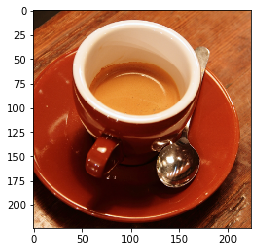

In [13]:
plt.imshow(img)

In [15]:
#add dimension

img_4d = np.expand_dims(img, axis=0)

In [16]:
img_4d.shape

(1, 224, 224, 3)

In [17]:
# make prediction

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    res = sess.run(softmax, feed_dict={x:img_4d})
    print(res.shape)
    res=res[0]
    print([(res[idx], net['labels'][idx]) for idx in res.argsort()[-5:][::-1]]) # print top 5 predictions

(1, 1000)
[(0.91845381, (967, 'n07920052 espresso')), (0.072874643, (968, 'n07930864 cup')), (0.0038409403, (925, 'n07584110 consomme')), (0.0011185195, (868, 'n04476259 tray')), (0.00097493245, (504, 'n03063599 coffee mug'))]


In [18]:
len(res)

1000

In [22]:
top = np.argmax(res)
print(top)

967


In [23]:
net['labels'][967]

(967, 'n07920052 espresso')

In [27]:
dropout = g.get_tensor_by_name('vgg/dropout_1/random_uniform:0')
dropout.get_shape().as_list()

[None, 4096]

In [26]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    v = sess.run(dropout, feed_dict={x:img_4d})
    print(v.shape)

(1, 4096)


In [28]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    content_layer = 'vgg/conv4_2/conv4_2:0'
    content_features = g.get_tensor_by_name(content_layer).eval(session=sess,
                                                               feed_dict={x:img_4d,
                                                                         'vgg/dropout_1/random_uniform:0':[[1.0]*4096],
                                                                         'vgg/dropout/random_uniform:0':[[1.0]*4096]
                                                                         }) #set dropout to 1 to prevent dropout
    print(content_features.shape)

(1, 28, 28, 512)


In [35]:
l = content_features[0]

In [36]:
l.shape

(28, 28, 512)

In [37]:
l = np.sum(l, axis=2)

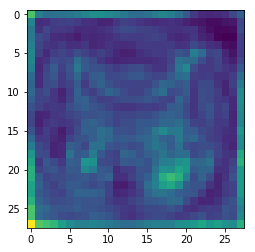

In [38]:
plt.imshow(l)

In [39]:
#download style image

filepath = utils.download('https://upload.wikimedia.org/wikipedia/commons/thumb/a/ae/El_jard%C3%ADn_de_las_Delicias%2C_de_El_Bosco.jpg/640px-El_jard%C3%ADn_de_las_Delicias%2C_de_El_Bosco.jpg')

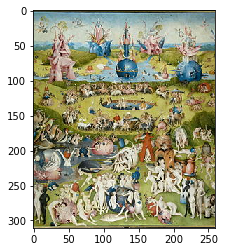

In [40]:
#crop image

style_og = plt.imread(filepath)[15:-15, 190:-190,:]
plt.imshow(style_og)

In [41]:
#preprocess
style_img = vgg16.preprocess(style_og)

C:\Users\itpstudent\Miniconda3\envs\tensorflow\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


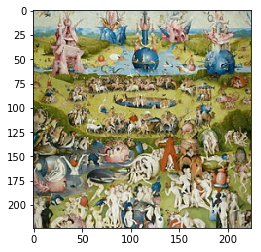

In [42]:
plt.imshow(style_img)

In [44]:
style_img_4d = np.expand_dims(style_img, axis=0)

In [45]:
style_img_4d.shape

(1, 224, 224, 3)

In [47]:
# make prediction

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    res = softmax.eval(feed_dict={x:style_img_4d})[0]
    print([(res[idx], net['labels'][idx]) for idx in res.argsort()[-5:][::-1]])

[(0.29669052, (611, 'n03598930 jigsaw puzzle')), (0.16107541, (868, 'n04476259 tray')), (0.11381193, (406, 'n02699494 altar')), (0.045336105, (849, 'n04398044 teapot')), (0.036799058, (892, 'n04548280 wall clock'))]


In [48]:
# find style features

style_layers = ['vgg/conv1_1/conv1_1:0',
               'vgg/conv2_1/conv2_1:0',
               'vgg/conv3_1/conv3_1:0',
               'vgg/conv4_1/conv4_1:0',
               'vgg/conv5_1/conv5_1:0',]

style_activations = []

In [49]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    for style_i in style_layers:
        style_activation_i = g.get_tensor_by_name(style_i).eval(feed_dict={x: style_img_4d,
                                                                          'vgg/dropout_1/random_uniform:0': [[1.0]*4096],
                                                                           'vgg/dropout/random_uniform:0': [[1.0]*4096],
                                                                          })
        style_activations.append(style_activation_i)

In [52]:
style_activations[4].shape

(1, 14, 14, 512)

In [53]:
style_activations[4].shape[-1]

512

In [54]:
new_shape = np.reshape(style_activations[4], [-1, style_activations[4].shape[-1]])
new_shape.shape

(196, 512)

In [56]:
style_features = []

for style_activation_i in style_activations:
    print("Original shape", style_activation_i.shape)
    s_i = np.reshape(style_activation_i, [-1, style_activation_i.shape[-1]])  #reshapeso every pixel of every channel is next to corresponding pixel in next channel
    print("New Shape", s_i.shape)
    gram_matrix = np.matmul(s_i.T, s_i) / s_i.size  #find gram matrix
    style_features.append(gram_matrix.astype(np.float32))

Original shape (1, 224, 224, 64)
New Shape (50176, 64)
Original shape (1, 112, 112, 128)
New Shape (12544, 128)
Original shape (1, 56, 56, 256)
New Shape (3136, 256)
Original shape (1, 28, 28, 512)
New Shape (784, 512)
Original shape (1, 14, 14, 512)
New Shape (196, 512)


In [57]:
from tensorflow.python.framework.ops import reset_default_graph

In [60]:
reset_default_graph()
g = tf.Graph()

In [61]:
# have to make input to vgg netowrk into a variable instead of placeholder
# so it can be optimized during style transfer

net = vgg16.get_vgg_model()

In [62]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    net_input = tf.Variable(img_4d)  #pass in content image to initialize variable
    tf.import_graph_def(net['graph_def'],
                       name='vgg',
                       input_map={'images:0':net_input})  #map input of vgg network to recently created variable instead

In [63]:
names = [op.name for op in g.get_operations()]
print(names)

['Variable/initial_value', 'Variable', 'Variable/Assign', 'Variable/read', 'vgg/images', 'vgg/mul/y', 'vgg/mul', 'vgg/split/split_dim', 'vgg/split', 'vgg/sub/y', 'vgg/sub', 'vgg/sub_1/y', 'vgg/sub_1', 'vgg/sub_2/y', 'vgg/sub_2', 'vgg/concat/concat_dim', 'vgg/concat', 'vgg/conv1_1/filter', 'vgg/conv1_1/Conv2D', 'vgg/conv1_1/biases', 'vgg/conv1_1/BiasAdd', 'vgg/conv1_1/conv1_1', 'vgg/conv1_2/filter', 'vgg/conv1_2/Conv2D', 'vgg/conv1_2/biases', 'vgg/conv1_2/BiasAdd', 'vgg/conv1_2/conv1_2', 'vgg/pool1', 'vgg/conv2_1/filter', 'vgg/conv2_1/Conv2D', 'vgg/conv2_1/biases', 'vgg/conv2_1/BiasAdd', 'vgg/conv2_1/conv2_1', 'vgg/conv2_2/filter', 'vgg/conv2_2/Conv2D', 'vgg/conv2_2/biases', 'vgg/conv2_2/BiasAdd', 'vgg/conv2_2/conv2_2', 'vgg/pool2', 'vgg/conv3_1/filter', 'vgg/conv3_1/Conv2D', 'vgg/conv3_1/biases', 'vgg/conv3_1/BiasAdd', 'vgg/conv3_1/conv3_1', 'vgg/conv3_2/filter', 'vgg/conv3_2/Conv2D', 'vgg/conv3_2/biases', 'vgg/conv3_2/BiasAdd', 'vgg/conv3_2/conv3_2', 'vgg/conv3_3/filter', 'vgg/conv3_3

In [64]:
#define the losses

# CONTENT LOSS

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    content_loss = tf.nn.l2_loss((g.get_tensor_by_name(content_layer)-content_features) / content_features.size)

In [66]:
content_loss

<tf.Tensor 'L2Loss:0' shape=() dtype=float32>

In [67]:
# STYLE LOSS

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    style_loss = np.float32(0.0)
    
    for style_layer_i, style_gram_i in zip(style_layers, style_features):
        layer_i = g.get_tensor_by_name(style_layer_i)
        layer_shape = layer_i.get_shape().as_list()
        layer_size = layer_shape[1] * layer_shape[2] * layer_shape[3]
        layer_flat = tf.reshape(layer_i, [-1, layer_shape[3]])
        gram_matrix = tf.matmul(tf.transpose(layer_flat), layer_flat) / layer_size
        style_loss = tf.add(style_loss, tf.nn.l2_loss((gram_matrix - style_gram_i)/np.float32(style_gram_i.size)))

In [69]:
# TOTAL VARIATION LOSS
# neighbouring pixels should be similar

def total_variation_loss(x):
    h, w = x.get_shape().as_list()[1], x.get_shape().as_list()[1]
    dx = tf.square(x[:, :h-1, :w-1, :] - x[:, :h-1, 1:, :])
    dy = tf.square(x[:, :h-1, :w-1, :] - x[:, 1:, :w-1, :])
    return tf.reduce_sum(tf.pow(dx+dy, 1.25))

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    tv_loss = total_variation_loss(net_input)

In [70]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    loss = 0.1 * content_loss + 5.0 * style_loss + 0.01 * tv_loss #combine all losses
    optimizer = tf.train.AdamOptimizer(0.01).minimize(loss)

0: 47.247395, (-0.010000 - 1.010000)


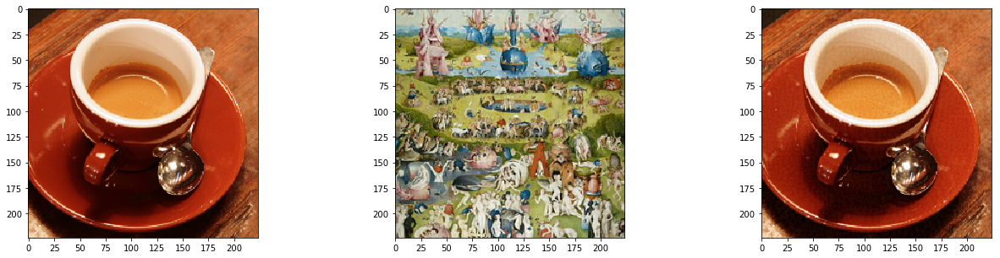

1: 41.527805, (-0.019984 - 1.020013)
2: 36.726242, (-0.029970 - 1.030036)
3: 33.132301, (-0.039943 - 1.040036)
4: 30.825279, (-0.049814 - 1.049982)
5: 29.472799, (-0.059614 - 1.059739)


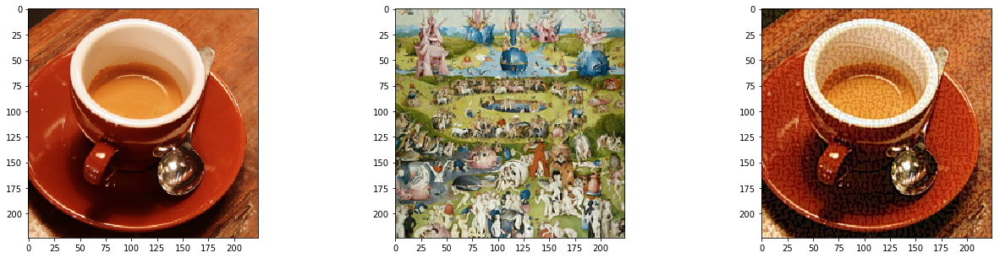

6: 28.482147, (-0.069084 - 1.069270)
7: 27.398527, (-0.078122 - 1.078805)
8: 26.078955, (-0.086861 - 1.088219)
9: 24.599190, (-0.096156 - 1.097538)
10: 23.106531, (-0.104688 - 1.106785)


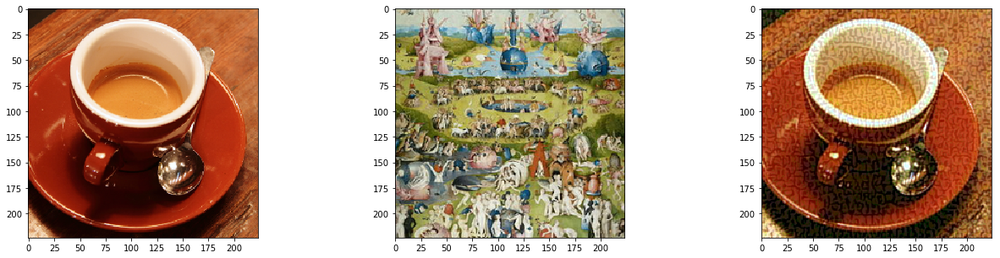

11: 21.728104, (-0.112565 - 1.116050)
12: 20.532928, (-0.121970 - 1.125387)
13: 19.527975, (-0.132241 - 1.134814)
14: 18.680069, (-0.142458 - 1.144342)
15: 17.944130, (-0.152462 - 1.153988)


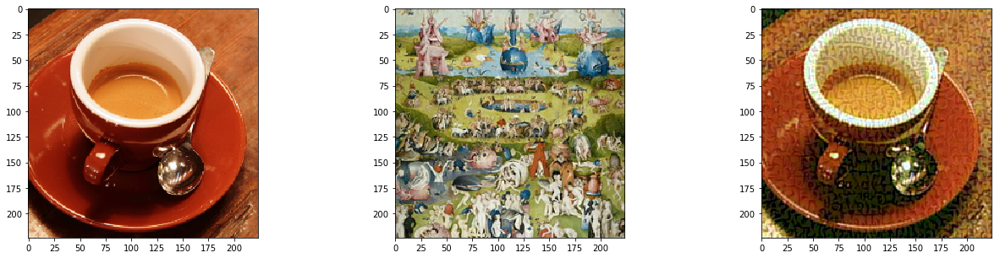

16: 17.281292, (-0.162252 - 1.163745)
17: 16.672485, (-0.171584 - 1.173564)
18: 16.113853, (-0.179912 - 1.183393)
19: 15.612648, (-0.186529 - 1.193166)
20: 15.175383, (-0.190812 - 1.202783)


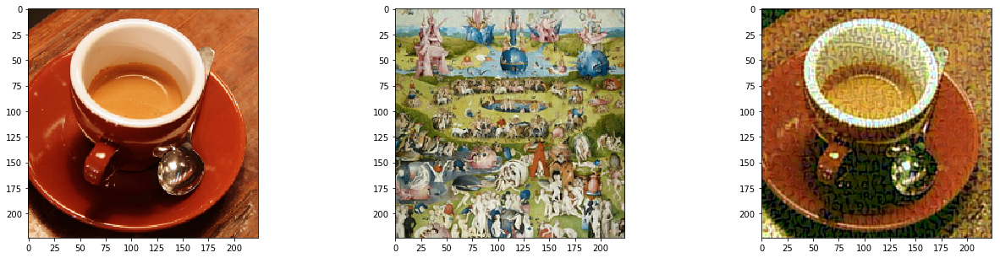

21: 14.799289, (-0.193791 - 1.212068)
22: 14.471754, (-0.202588 - 1.220961)
23: 14.174028, (-0.210886 - 1.229360)
24: 13.889014, (-0.218536 - 1.237176)
25: 13.608898, (-0.225461 - 1.244391)


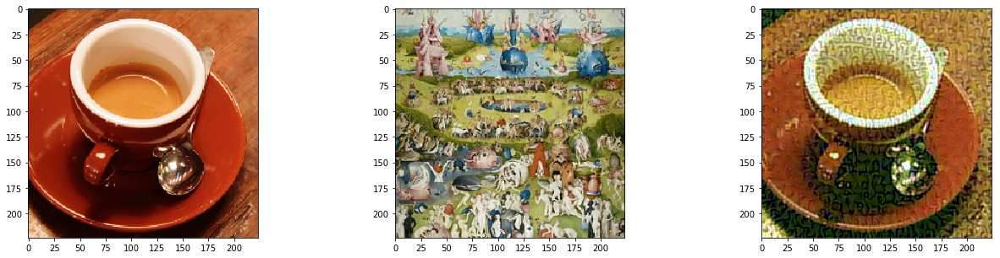

26: 13.335521, (-0.231640 - 1.251007)
27: 13.076487, (-0.237158 - 1.257059)
28: 12.839395, (-0.242111 - 1.262581)
29: 12.627529, (-0.246511 - 1.267612)
30: 12.438425, (-0.250429 - 1.272236)


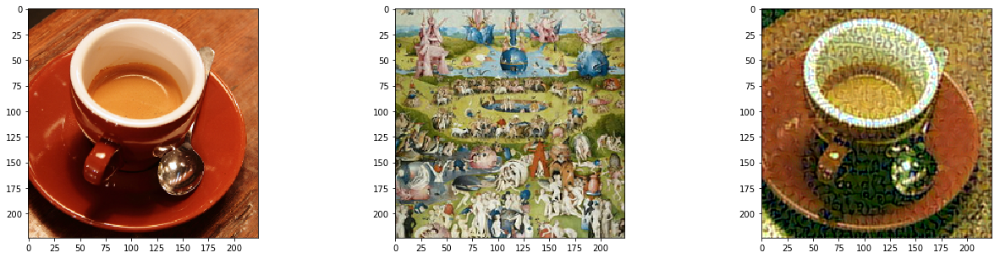

31: 12.266382, (-0.253931 - 1.276487)
32: 12.105048, (-0.256977 - 1.280332)
33: 11.950686, (-0.264054 - 1.283623)
34: 11.802820, (-0.273489 - 1.286340)
35: 11.663645, (-0.282812 - 1.291377)


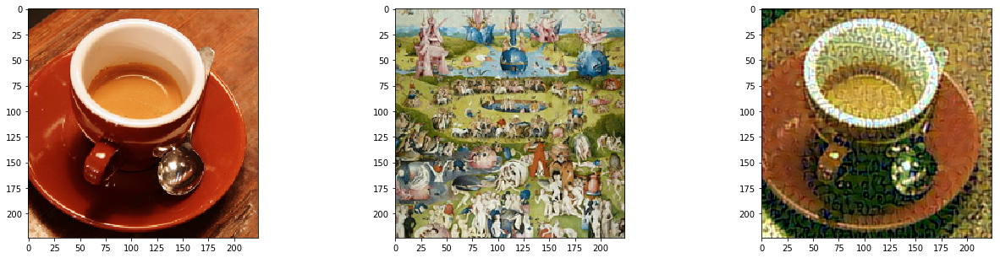

36: 11.535483, (-0.291951 - 1.297153)
37: 11.419310, (-0.300818 - 1.302282)
38: 11.313498, (-0.309337 - 1.306694)
39: 11.214928, (-0.317451 - 1.310351)
40: 11.120342, (-0.325121 - 1.313269)


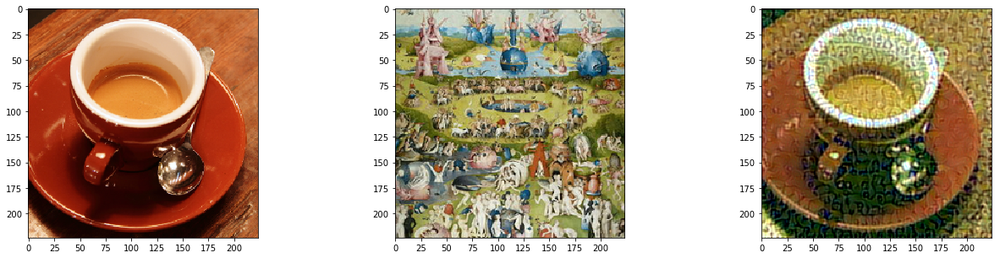

41: 11.028152, (-0.332348 - 1.315510)
42: 10.938959, (-0.339149 - 1.317153)
43: 10.854775, (-0.345559 - 1.318339)
44: 10.776854, (-0.351614 - 1.319198)
45: 10.705059, (-0.357339 - 1.319818)


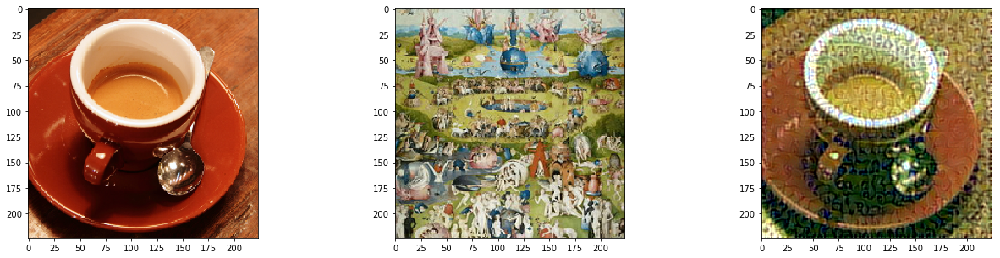

46: 10.638161, (-0.362758 - 1.320299)
47: 10.574564, (-0.367860 - 1.320706)
48: 10.513245, (-0.372625 - 1.321088)
49: 10.454480, (-0.377020 - 1.321415)
50: 10.398919, (-0.380979 - 1.321647)


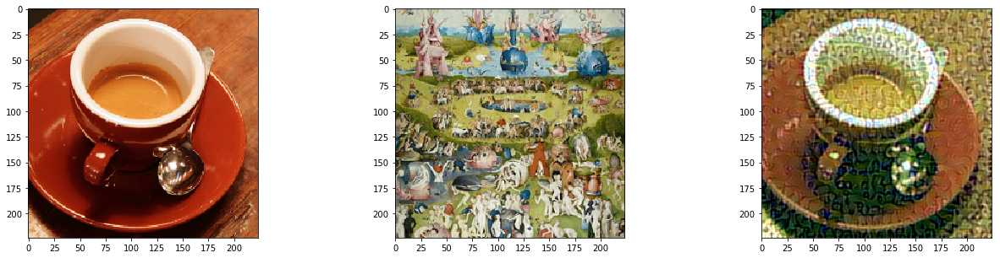

51: 10.346948, (-0.384449 - 1.322753)
52: 10.298342, (-0.387394 - 1.327246)
53: 10.252337, (-0.389796 - 1.331764)
54: 10.207842, (-0.391650 - 1.339240)
55: 10.164533, (-0.392998 - 1.346613)


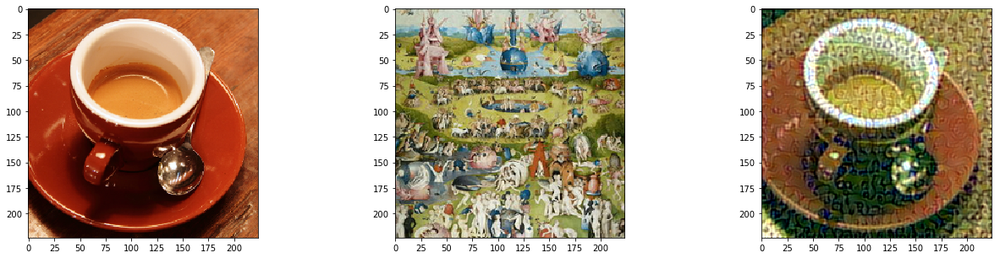

56: 10.122570, (-0.393888 - 1.353872)
57: 10.082378, (-0.394380 - 1.361055)
58: 10.044312, (-0.394547 - 1.368182)
59: 10.008249, (-0.394446 - 1.375260)
60: 9.973786, (-0.394133 - 1.382312)


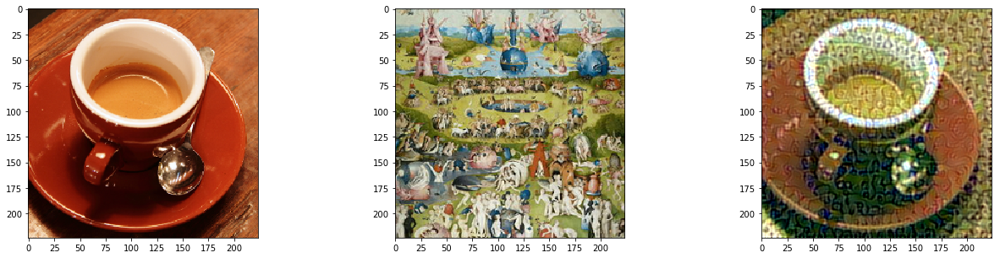

61: 9.940500, (-0.393640 - 1.389297)
62: 9.908328, (-0.392965 - 1.396187)
63: 9.877380, (-0.392091 - 1.402975)
64: 9.847874, (-0.391002 - 1.409664)
65: 9.819803, (-0.389706 - 1.416199)


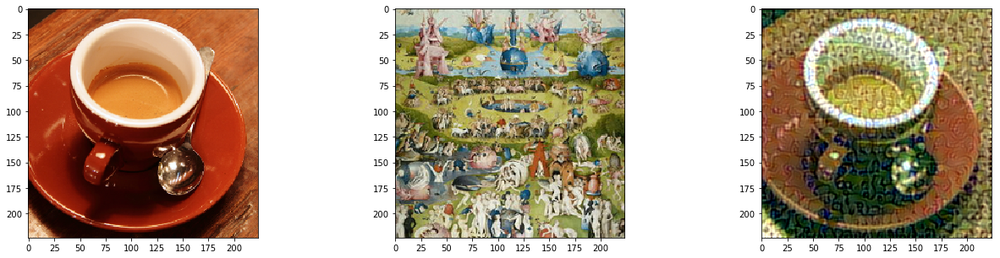

66: 9.792816, (-0.388211 - 1.422515)
67: 9.766642, (-0.386525 - 1.428576)
68: 9.741159, (-0.384685 - 1.434379)
69: 9.716427, (-0.396206 - 1.439867)
70: 9.692578, (-0.408153 - 1.445108)


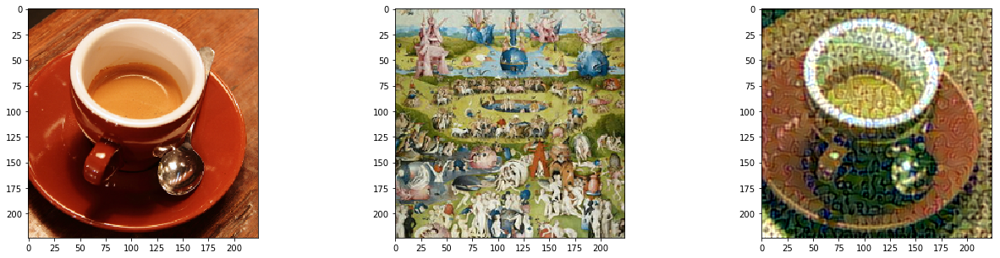

71: 9.669688, (-0.420205 - 1.450120)
72: 9.647593, (-0.432365 - 1.454925)
73: 9.626093, (-0.444631 - 1.459567)
74: 9.605221, (-0.456988 - 1.464041)
75: 9.584946, (-0.469428 - 1.468275)


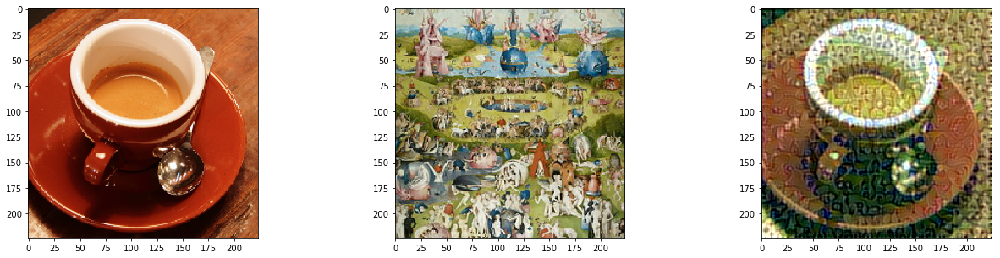

76: 9.565315, (-0.481937 - 1.472142)
77: 9.546329, (-0.494508 - 1.475670)
78: 9.527905, (-0.507137 - 1.478895)
79: 9.509952, (-0.519817 - 1.481831)
80: 9.492388, (-0.532546 - 1.484624)


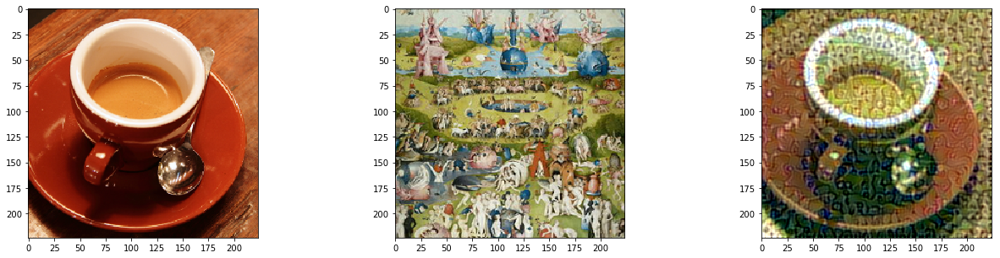

81: 9.475258, (-0.545345 - 1.487302)
82: 9.458557, (-0.558212 - 1.489874)
83: 9.442307, (-0.571143 - 1.492365)
84: 9.426498, (-0.584137 - 1.494823)
85: 9.411106, (-0.597180 - 1.497265)


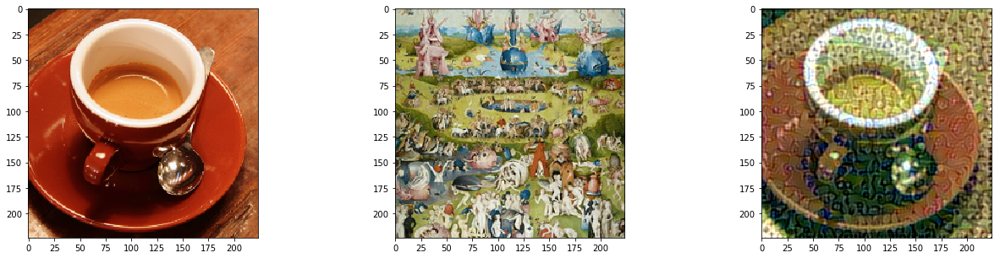

86: 9.396075, (-0.610270 - 1.501498)
87: 9.381426, (-0.623401 - 1.509426)
88: 9.367169, (-0.636563 - 1.517329)
89: 9.353307, (-0.649747 - 1.525500)
90: 9.339747, (-0.662950 - 1.533477)


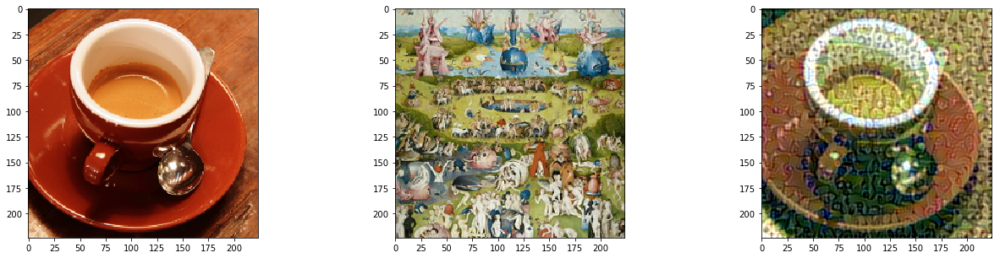

91: 9.326477, (-0.676179 - 1.541204)
92: 9.313478, (-0.689437 - 1.548633)
93: 9.300806, (-0.702732 - 1.555890)
94: 9.288398, (-0.716068 - 1.563023)
95: 9.276305, (-0.729451 - 1.570024)


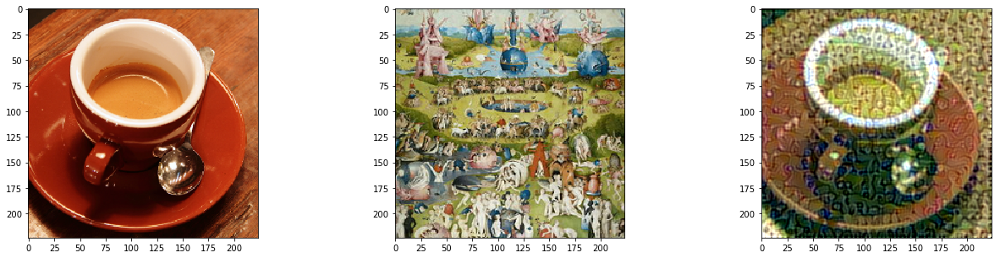

96: 9.264475, (-0.742879 - 1.576913)
97: 9.252927, (-0.756355 - 1.583709)
98: 9.241612, (-0.769866 - 1.590348)
99: 9.230546, (-0.783412 - 1.596855)


In [72]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    sess.run(tf.global_variables_initializer())
    n_iterations = 100
    og_img = net_input.eval()
    imgs = []
    
    for it_i in range(n_iterations):
        _, this_loss, synth = sess.run([optimizer, loss, net_input],
                                      feed_dict={'vgg/dropout_1/random_uniform:0':np.ones(g.get_tensor_by_name('vgg/dropout_1/random_uniform:0').get_shape().as_list()),
                                                'vgg/dropout/random_uniform:0':np.ones(g.get_tensor_by_name('vgg/dropout/random_uniform:0').get_shape().as_list())
                                                })
        
        print("%d: %f, (%f - %f)" % (it_i, this_loss, np.min(synth), np.max(synth)))
        
        if it_i % 5 == 0:
            imgs.append(np.clip(synth[0],0,1))
            fig, ax = plt.subplots(1,3,figsize=(22,5))
            ax[0].imshow(vgg16.deprocess(img))
            ax[1].imshow(vgg16.deprocess(style_img))
            ax[2].imshow(vgg16.deprocess(synth[0]))
            plt.show()
            fig.canvas.draw()